In [146]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import sys
import warnings
from sklearn.linear_model import LinearRegression,Ridge,Lasso
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
%matplotlib inline

In [147]:
data =  pd.read_csv("open-meteo-hourly-dataset.csv")
data.head()

,time,temperature_2m (°F),relative_humidity_2m (%),dew_point_2m (°F),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),weather_code (wmo code),pressure_msl (hPa),cloud_cover (%),wind_speed_10m (mp/h),wind_speed_100m (mp/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (mp/h)
0,2010-01-01T00:00,31.8,86,28.0,0.0,0.0,0.0,0.0,3,1003.3,86,11.3,19.8,21,27,21.9
1,2010-01-01T01:00,31.3,86,27.7,0.0,0.0,0.0,0.0,3,1003.4,93,11.1,19.6,19,24,20.8
2,2010-01-01T02:00,30.7,87,27.2,0.0,0.0,0.0,0.0,3,1003.5,81,11.4,20.1,16,21,20.8
3,2010-01-01T03:00,30.3,87,26.8,0.0,0.0,0.0,0.0,0,1004.0,4,11.5,20.4,13,19,20.8
4,2010-01-01T04:00,29.9,87,26.5,0.0,0.0,0.0,0.0,0,1004.3,3,11.2,20.0,13,18,20.6


In [148]:
data.shape

(130392, 16)

In [149]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130392 entries, 0 to 130391
Data columns (total 16 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   time                      130392 non-null  object 
 1   temperature_2m (°F)       130392 non-null  float64
 2   relative_humidity_2m (%)  130392 non-null  int64  
 3   dew_point_2m (°F)         130392 non-null  float64
 4   precipitation (mm)        130392 non-null  float64
 5   rain (mm)                 130392 non-null  float64
 6   snowfall (cm)             130392 non-null  float64
 7   snow_depth (m)            129912 non-null  float64
 8   weather_code (wmo code)   130392 non-null  int64  
 9   pressure_msl (hPa)        130392 non-null  float64
 10  cloud_cover (%)           130392 non-null  int64  
 11  wind_speed_10m (mp/h)     130392 non-null  float64
 12  wind_speed_100m (mp/h)    130392 non-null  float64
 13  wind_direction_10m (°)    130392 non-null  i

In [150]:
data.isnull().sum()

time                          0
temperature_2m (°F)           0
relative_humidity_2m (%)      0
dew_point_2m (°F)             0
precipitation (mm)            0
rain (mm)                     0
snowfall (cm)                 0
snow_depth (m)              480
weather_code (wmo code)       0
pressure_msl (hPa)            0
cloud_cover (%)               0
wind_speed_10m (mp/h)         0
wind_speed_100m (mp/h)        0
wind_direction_10m (°)        0
wind_direction_100m (°)       0
wind_gusts_10m (mp/h)         0
dtype: int64

In [151]:
data['snow_depth (m)'].unique()

array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ,
       0.11,  nan])

In [152]:
data['snow_depth (m)'] = data['snow_depth (m)'].fillna(0.0)

In [153]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130392 entries, 0 to 130391
Data columns (total 16 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   time                      130392 non-null  object 
 1   temperature_2m (°F)       130392 non-null  float64
 2   relative_humidity_2m (%)  130392 non-null  int64  
 3   dew_point_2m (°F)         130392 non-null  float64
 4   precipitation (mm)        130392 non-null  float64
 5   rain (mm)                 130392 non-null  float64
 6   snowfall (cm)             130392 non-null  float64
 7   snow_depth (m)            130392 non-null  float64
 8   weather_code (wmo code)   130392 non-null  int64  
 9   pressure_msl (hPa)        130392 non-null  float64
 10  cloud_cover (%)           130392 non-null  int64  
 11  wind_speed_10m (mp/h)     130392 non-null  float64
 12  wind_speed_100m (mp/h)    130392 non-null  float64
 13  wind_direction_10m (°)    130392 non-null  i

In [154]:
data = data.rename(columns={"temperature_2m (°F)": "temp", "relative_humidity_2m (%)": "humidity",
                            "dew_point_2m (°F)":"dew","precipitation (mm)":"precip","rain (mm)":"rain",
                            "snowfall (cm)":"snowfall","snow_depth (m)":"snowdepth","weather_code (wmo code)":"wmocode",
                            "pressure_msl (hPa)":"surfpressure","cloud_cover (%)":"cloudcover","wind_speed_10m (mp/h)":"windspeed10m",
                            "wind_speed_100m (mp/h)":"windspeed100m","wind_direction_10m (°)":"winddir10m","wind_direction_100m (°)":"winddir100m",
                            "wind_gusts_10m (mp/h)":"windgusts"})

In [155]:
data.head()

,time,temp,humidity,dew,precip,rain,snowfall,snowdepth,wmocode,surfpressure,cloudcover,windspeed10m,windspeed100m,winddir10m,winddir100m,windgusts
0,2010-01-01T00:00,31.8,86,28.0,0.0,0.0,0.0,0.0,3,1003.3,86,11.3,19.8,21,27,21.9
1,2010-01-01T01:00,31.3,86,27.7,0.0,0.0,0.0,0.0,3,1003.4,93,11.1,19.6,19,24,20.8
2,2010-01-01T02:00,30.7,87,27.2,0.0,0.0,0.0,0.0,3,1003.5,81,11.4,20.1,16,21,20.8
3,2010-01-01T03:00,30.3,87,26.8,0.0,0.0,0.0,0.0,0,1004.0,4,11.5,20.4,13,19,20.8
4,2010-01-01T04:00,29.9,87,26.5,0.0,0.0,0.0,0.0,0,1004.3,3,11.2,20.0,13,18,20.6


In [156]:
data[['temp','humidity','dew','precip','rain','snowfall','snowdepth','wmocode','surfpressure','cloudcover','windspeed10m','windspeed100m','winddir10m','winddir100m','windgusts']].std()

temp              9.584527
humidity         12.070598
dew               8.610142
precip            0.370335
rain              0.368299
snowfall          0.021608
snowdepth         0.004480
wmocode          19.896166
surfpressure     11.035546
cloudcover       35.704643
windspeed10m      4.683849
windspeed100m     7.024998
winddir10m       96.597168
winddir100m      96.420750
windgusts         8.996574
dtype: float64

In [157]:
data['precipprob'] = data['precip'].apply(lambda x : 100 if x > 0.0 else 0)

In [158]:
data.head()

,time,temp,humidity,dew,precip,rain,snowfall,snowdepth,wmocode,surfpressure,cloudcover,windspeed10m,windspeed100m,winddir10m,winddir100m,windgusts,precipprob
0,2010-01-01T00:00,31.8,86,28.0,0.0,0.0,0.0,0.0,3,1003.3,86,11.3,19.8,21,27,21.9,0
1,2010-01-01T01:00,31.3,86,27.7,0.0,0.0,0.0,0.0,3,1003.4,93,11.1,19.6,19,24,20.8,0
2,2010-01-01T02:00,30.7,87,27.2,0.0,0.0,0.0,0.0,3,1003.5,81,11.4,20.1,16,21,20.8,0
3,2010-01-01T03:00,30.3,87,26.8,0.0,0.0,0.0,0.0,0,1004.0,4,11.5,20.4,13,19,20.8,0
4,2010-01-01T04:00,29.9,87,26.5,0.0,0.0,0.0,0.0,0,1004.3,3,11.2,20.0,13,18,20.6,0


In [159]:
data['condition'] = data['rain'].apply(lambda x : 'rain' if x > 0.0 else 'no rain')

In [160]:
weather_data = data[['temp','humidity','dew','precip','rain','surfpressure','cloudcover','windspeed10m','winddir10m','windgusts','precipprob']]

In [161]:
weather_data.head()

,temp,humidity,dew,precip,rain,surfpressure,cloudcover,windspeed10m,winddir10m,windgusts,precipprob
0,31.8,86,28.0,0.0,0.0,1003.3,86,11.3,21,21.9,0
1,31.3,86,27.7,0.0,0.0,1003.4,93,11.1,19,20.8,0
2,30.7,87,27.2,0.0,0.0,1003.5,81,11.4,16,20.8,0
3,30.3,87,26.8,0.0,0.0,1004.0,4,11.5,13,20.8,0
4,29.9,87,26.5,0.0,0.0,1004.3,3,11.2,13,20.6,0


In [162]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
# import the metrics class
from sklearn import metrics
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE

In [163]:
X = weather_data[['temp','humidity','dew','surfpressure','cloudcover','winddir10m','windgusts']]
y = weather_data['precipprob']
smote = SMOTE()
X_resampled, y_resampled = smote.fit_resample(X, y)
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

In [164]:
#scaler = StandardScaler()
#X_scaled = scaler.fit_transform(X=X)
#prin_comp = PCA(n_components=4)
#X_prin_comp = prin_comp.fit_transform(X_scaled)
#new_weather_df = pd.DataFrame(data=X_prin_comp,columns=["PC1","PC2","PC3","PC4"])
#new_weather_df['target'] = y

In [165]:
#print("Explained Variance Ratio:", prin_comp.explained_variance_ratio_)

In [166]:
#new_weather_df['target'].unique

In [167]:
# instantiate the model (using the default parameters)
logreg = LogisticRegression(max_iter=500,random_state=42,class_weight='balanced')

# fit the model with data
logreg.fit(X_train, y_train)

y_pred = logreg.predict(X_test)

In [168]:
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix

array([[16060,  5211],
       [ 4055, 17283]], dtype=int64)

NameError: name 'pd' is not defined

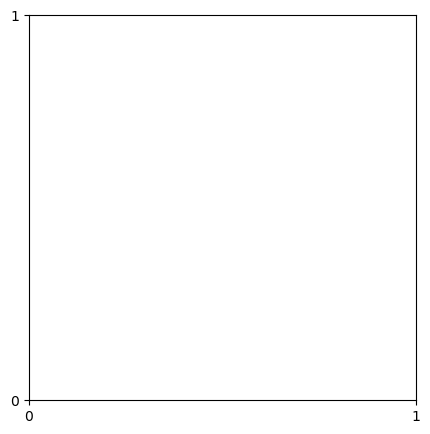

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [170]:
from sklearn.metrics import classification_report
target_names = ['no rain', 'rain']
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

     no rain       0.80      0.76      0.78     21271
        rain       0.77      0.81      0.79     21338

    accuracy                           0.78     42609
   macro avg       0.78      0.78      0.78     42609
weighted avg       0.78      0.78      0.78     42609



In [171]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import Perceptron
#from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay

In [172]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy", max_depth=3)

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

In [173]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.7466967072684175


In [174]:
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9047149663216691


In [175]:
grad_boost_reg = GradientBoostingClassifier(n_estimators=1,max_depth=70,learning_rate=100,criterion='squared_error')
#grad_boost_reg = GradientBoostingClassifier()
grad_boost_reg.fit(X_train,y_train)
y_pred = grad_boost_reg.predict(X_test)

In [176]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8461827313478373


In [177]:
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train,y_train)
y_pred = knn_model.predict(X_test)

In [178]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8808937079020864


In [ ]:
#Initializing the SVM model
svm_model = SVC(kernel='rbf',C=0.1,gamma='auto')

#Training the model
svm_model.fit(X_train, y_train)

# Predict on the test set
svm_y_pred = svm_model.predict(X_test)

svm_cnf_matrix = metrics.confusion_matrix(y_test, svm_y_pred)
print(svm_y_pred)
print(classification_report(y_test, svm_y_pred, target_names=['no rain','rain']))

In [180]:
from sklearn.model_selection import GridSearchCV

In [181]:
param_grid = {
    'eta0': [0.001, 0.01, 0.1],
    'alpha': [0.0001, 0.001, 0.01],
    'max_iter': [1000, 2000]
}
grid_search = GridSearchCV(Perceptron(), param_grid, cv=5)
grid_search.fit(X_train, y_train)
print(grid_search.best_params_)


{'alpha': 0.0001, 'eta0': 0.001, 'max_iter': 1000}


In [182]:
model = Perceptron(eta0=0.001, max_iter=1000,alpha=0.0001)
model.fit(X_train, y_train)

Perceptron(eta0=0.001)

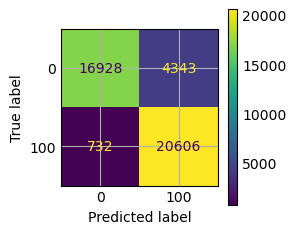

In [183]:
conf_matrix1 = confusion_matrix(y_test,y_pred,labels=model.classes_)
disp1 = ConfusionMatrixDisplay(confusion_matrix=conf_matrix1,display_labels=model.classes_)
disp1.plot()

In [184]:
model.score(X_test,y_test)

0.6584055011851956

In [185]:
from sklearn.linear_model import LassoCV, RidgeCV
lasso_cv_model = LassoCV(cv=10)
lasso_cv_model.fit(X_train, y_train)

# Best alpha from cross-validation
print(f"Best alpha for Lasso: {lasso_cv_model.alpha_}")

# RidgeCV (Ridge with cross-validation for alpha)
ridge_cv_model = RidgeCV(cv=5)
ridge_cv_model.fit(X_train, y_train)

# Best alpha from cross-validation
print(f"Best alpha for Ridge: {ridge_cv_model.alpha_}")


c:\Users\sneha\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.277e+05, tolerance: 4.261e+04
  model = cd_fast.enet_coordinate_descent(


Best alpha for Lasso: 0.6582483015248971
Best alpha for Ridge: 10.0


In [186]:
from sklearn.linear_model import Lasso,Ridge,RidgeClassifier
from sklearn.metrics import mean_squared_error
lasso_model = Lasso(alpha=0.6584012058025467)
lasso_model.fit(X_train, y_train)

# Predictions
y_pred = lasso_model.predict(X_test)

# Evaluate the model using Mean Squared Error
mse = mean_squared_error(y_test, y_pred)
print(f"Lasso Regression MSE: {mse}")
r2 = r2_score(y_test, y_pred)
r2


Lasso Regression MSE: 1593.7963537254832


c:\Users\sneha\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.267e+05, tolerance: 4.261e+04
  model = cd_fast.enet_coordinate_descent(


0.36247988220276406

In [187]:
# Create a Ridge model with a regularization strength of 0.1
ridge_model = Ridge(alpha=0.1)

# Fit the model
ridge_model.fit(X_train, y_train)

# Predictions
y_pred = ridge_model.predict(X_test)

# Evaluate the model using Mean Squared Error
mse = mean_squared_error(y_test, y_pred)
print(f"Ridge Regression MSE: {mse}")


Ridge Regression MSE: 1581.8290446236442


In [188]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(degree=3)
X_poly = poly.fit_transform(X_train)
# Step 4: Fit the polynomial regression model
poly_model = LinearRegression()
poly_model.fit(X_poly, y_train)

# Step 5: Predict on the test set (transform the features as well)
X_test_poly = poly.transform(X_test)
y_pred = poly_model.predict(X_test_poly)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Mean Squared Error: 1277.4168220999306
R-squared: 0.4890320077607683


In [189]:
# LInear regression
lin_regr = LinearRegression()
lin_regr.fit(X_train,y_train)
y_pred = lin_regr.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Mean Squared Error: 1581.829045001873
R-squared: 0.36726681752819523


In [190]:
weather_data.corr()

,temp,humidity,dew,precip,rain,surfpressure,cloudcover,windspeed10m,winddir10m,windgusts,precipprob
temp,1.000000,-0.387780,0.888765,0.037554,0.043279,-0.002965,0.074517,0.045900,0.042390,0.111408,0.082816
humidity,-0.387780,1.000000,0.073930,0.140774,0.139537,-0.098626,0.189952,-0.211821,0.008271,-0.294157,0.125639
dew,0.888765,0.073930,1.000000,0.110421,0.116148,-0.057904,0.176021,-0.040066,0.052473,-0.009704,0.155358
precip,0.037554,0.140774,0.110421,1.000000,0.996530,-0.264433,0.198505,0.202848,-0.063249,0.227835,0.574666
rain,0.043279,0.139537,0.116148,0.996530,1.000000,-0.261567,0.197300,0.201204,-0.060465,0.226532,0.571812
surfpressure,-0.002965,-0.098626,-0.057904,-0.264433,-0.261567,1.000000,-0.183956,-0.353162,-0.051569,-0.366657,-0.354880
cloudcover,0.074517,0.189952,0.176021,0.198505,0.197300,-0.183956,1.000000,0.137449,-0.071285,0.134110,0.286998
windspeed10m,0.045900,-0.211821,-0.040066,0.202848,0.201204,-0.353162,0.137449,1.000000,0.059192,0.964781,0.263067
winddir10m,0.042390,0.008271,0.052473,-0.063249,-0.060465,-0.051569,-0.071285,0.059192,1.000000,0.062314,-0.052330
windgusts,0.111408,-0.294157,-0.009704,0.227835,0.226532,-0.366657,0.134110,0.964781,0.062314,1.000000,0.295472


In [191]:
data['time'] = pd.to_datetime(data['time'])
data

,time,temp,humidity,dew,precip,rain,snowfall,snowdepth,wmocode,surfpressure,cloudcover,windspeed10m,windspeed100m,winddir10m,winddir100m,windgusts,precipprob,condition
0,2010-01-01 00:00:00,31.8,86,28.0,0.0,0.0,0.0,0.0,3,1003.3,86,11.3,19.8,21,27,21.9,0,no rain
1,2010-01-01 01:00:00,31.3,86,27.7,0.0,0.0,0.0,0.0,3,1003.4,93,11.1,19.6,19,24,20.8,0,no rain
2,2010-01-01 02:00:00,30.7,87,27.2,0.0,0.0,0.0,0.0,3,1003.5,81,11.4,20.1,16,21,20.8,0,no rain
3,2010-01-01 03:00:00,30.3,87,26.8,0.0,0.0,0.0,0.0,0,1004.0,4,11.5,20.4,13,19,20.8,0,no rain
4,2010-01-01 04:00:00,29.9,87,26.5,0.0,0.0,0.0,0.0,0,1004.3,3,11.2,20.0,13,18,20.6,0,no rain
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130387,2024-11-15 19:00:00,41.1,100,41.1,0.0,0.0,0.0,0.0,3,1025.5,86,1.6,3.3,240,211,2.7,0,no rain
130388,2024-11-15 20:00:00,40.1,100,40.1,0.0,0.0,0.0,0.0,3,1025.3,100,1.1,3.9,281,210,2.7,0,no rain
130389,2024-11-15 21:00:00,38.4,100,38.4,0.0,0.0,0.0,0.0,3,1025.3,99,1.3,3.3,315,230,3.1,0,no rain
130390,2024-11-15 22:00:00,38.4,100,38.4,0.0,0.0,0.0,0.0,3,1025.2,100,2.3,2.1,337,286,5.4,0,no rain


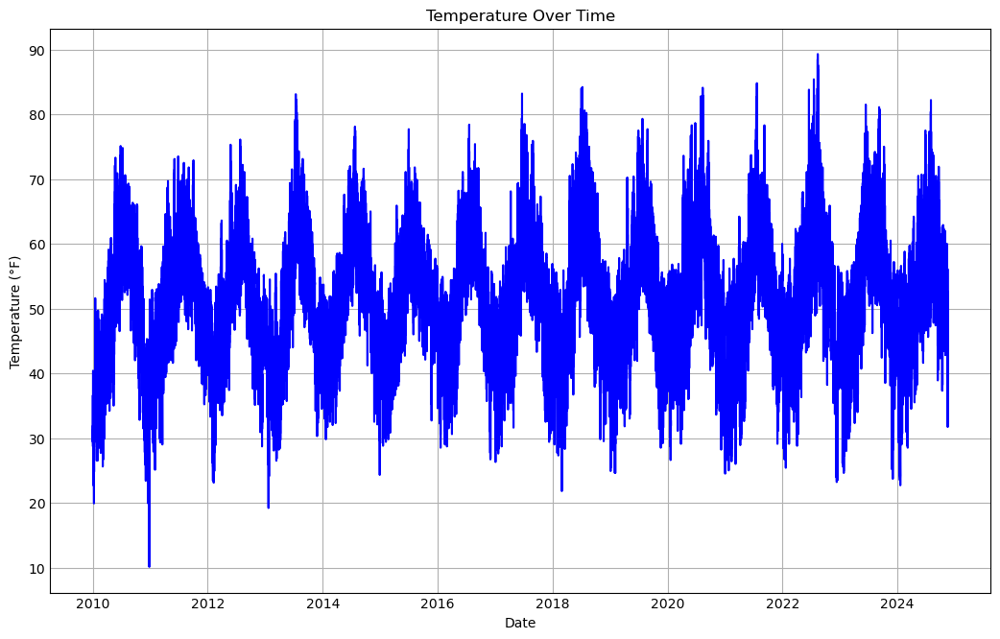

In [192]:
plt.figure(figsize=(10, 6))
plt.plot(data['time'], data['temp'], color='blue')
plt.title('Temperature Over Time')
plt.xlabel('Date')
plt.ylabel('Temperature (°F)')
plt.grid(True)
plt.show()

In [193]:
weather_data

,temp,humidity,dew,precip,rain,surfpressure,cloudcover,windspeed10m,winddir10m,windgusts,precipprob
0,31.8,86,28.0,0.0,0.0,1003.3,86,11.3,21,21.9,0
1,31.3,86,27.7,0.0,0.0,1003.4,93,11.1,19,20.8,0
2,30.7,87,27.2,0.0,0.0,1003.5,81,11.4,16,20.8,0
3,30.3,87,26.8,0.0,0.0,1004.0,4,11.5,13,20.8,0
4,29.9,87,26.5,0.0,0.0,1004.3,3,11.2,13,20.6,0
...,...,...,...,...,...,...,...,...,...,...,...
130387,41.1,100,41.1,0.0,0.0,1025.5,86,1.6,240,2.7,0
130388,40.1,100,40.1,0.0,0.0,1025.3,100,1.1,281,2.7,0
130389,38.4,100,38.4,0.0,0.0,1025.3,99,1.3,315,3.1,0
130390,38.4,100,38.4,0.0,0.0,1025.2,100,2.3,337,5.4,0


In [194]:
from sklearn.cluster import KMeans

In [195]:
features = weather_data[['temp', 'humidity','dew', 'windspeed10m','winddir10m','windgusts','rain', 'precip']]
kmeans = KMeans(n_clusters=2, random_state=42)
weather_data['Cluster'] = kmeans.fit_predict(features)

C:\Users\sneha\AppData\Local\Temp\ipykernel_19316\1815122924.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  weather_data['Cluster'] = kmeans.fit_predict(features)


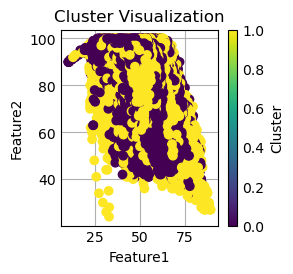

In [196]:
plt.scatter(weather_data['temp'], weather_data['humidity'], c=weather_data['Cluster'], cmap='viridis')
plt.title('Cluster Visualization')
plt.xlabel('Feature1')
plt.ylabel('Feature2')
plt.colorbar(label='Cluster')
plt.show()

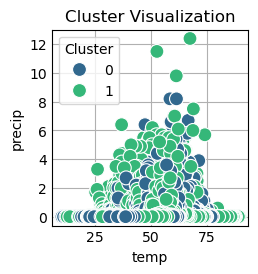

In [197]:
sns.scatterplot(data=weather_data, x='temp', y='precip', hue='Cluster', palette='viridis', s=100)
plt.title('Cluster Visualization')
plt.show()

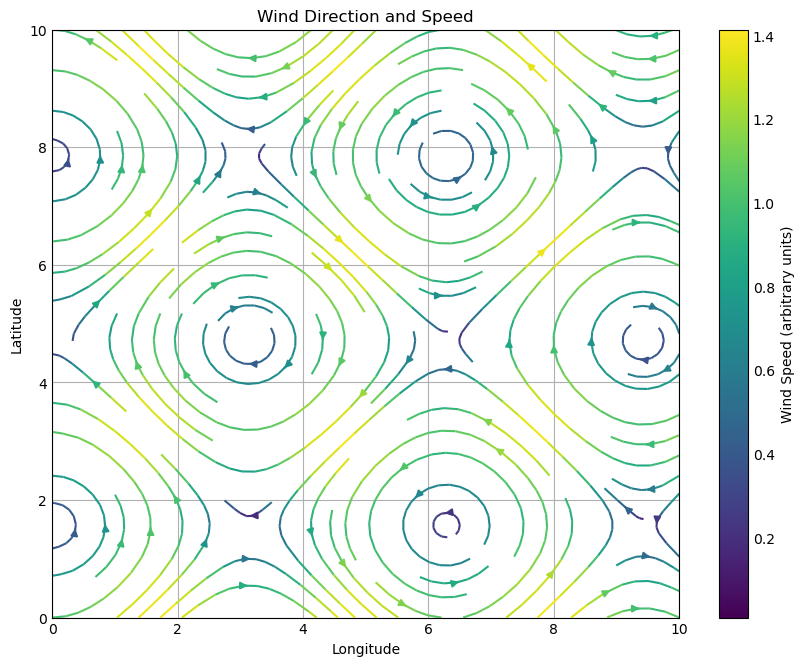

In [198]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data for wind vectors
x, y = np.meshgrid(np.linspace(0, 10, 20), np.linspace(0, 10, 20))
u = np.cos(y)  # X-component of wind
v = np.sin(x)  # Y-component of wind

# Stream plot
plt.figure(figsize=(8, 6))
plt.streamplot(x, y, u, v, color=np.sqrt(u**2 + v**2), cmap='viridis')
plt.colorbar(label='Wind Speed (arbitrary units)')
plt.title('Wind Direction and Speed')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [199]:
stream_plot_data = weather_data.copy()
x_unsort = np.array(stream_plot_data["windspeed10m"])
y_unsort = np.array(stream_plot_data["winddir10m"])
sorted_indices = np.argsort(x_unsort)
x_sort = x_unsort[sorted_indices]
y_sort = y_unsort[sorted_indices]
u= -x_sort * np.sin(np.radians(y_sort))
v = -x_sort * np.cos(np.radians(y_sort))


In [200]:
stream_plot_data.head()

,temp,humidity,dew,precip,rain,surfpressure,cloudcover,windspeed10m,winddir10m,windgusts,precipprob,Cluster
0,31.8,86,28.0,0.0,0.0,1003.3,86,11.3,21,21.9,0,1
1,31.3,86,27.7,0.0,0.0,1003.4,93,11.1,19,20.8,0,1
2,30.7,87,27.2,0.0,0.0,1003.5,81,11.4,16,20.8,0,1
3,30.3,87,26.8,0.0,0.0,1004.0,4,11.5,13,20.8,0,1
4,29.9,87,26.5,0.0,0.0,1004.3,3,11.2,13,20.6,0,1


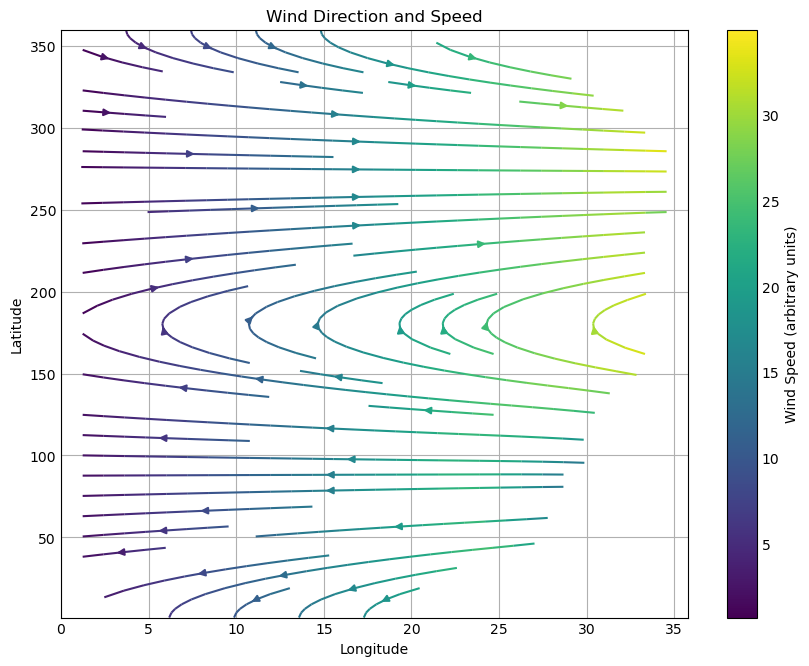

In [201]:
stream_plot_data = weather_data.copy()
x_unsort = np.array(stream_plot_data["windspeed10m"])
y_unsort = np.array(stream_plot_data["winddir10m"])
x = np.linspace(min(x_unsort), max(x_unsort), 50)  # Adjust the range and resolution
y = np.linspace(min(y_unsort), max(y_unsort), 50)
X, Y = np.meshgrid(x, y)
from scipy.interpolate import griddata
# Original data points and corresponding vector components
points = np.column_stack((x_unsort, y_unsort))
#sorted_indices = np.argsort(x_unsort)
#x_sort = x_unsort[sorted_indices]
#y_sort = y_unsort[sorted_indices]

u= -x_unsort * np.sin(np.radians(y_unsort))
v = -x_unsort * np.cos(np.radians(y_unsort))
U = griddata(points, u, (X, Y), method='linear')
V = griddata(points, v, (X, Y), method='linear')
plt.figure(figsize=(8, 6))
plt.streamplot(X, Y, U, V, color=np.sqrt(U**2 + V**2), cmap='viridis')
plt.colorbar(label='Wind Speed (arbitrary units)')
plt.title('Wind Direction and Speed')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

C:\Users\sneha\AppData\Local\Temp\ipykernel_19316\2516866346.py:6: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  new_data['temp'].resample('Y').mean().plot(figsize=(10,6))


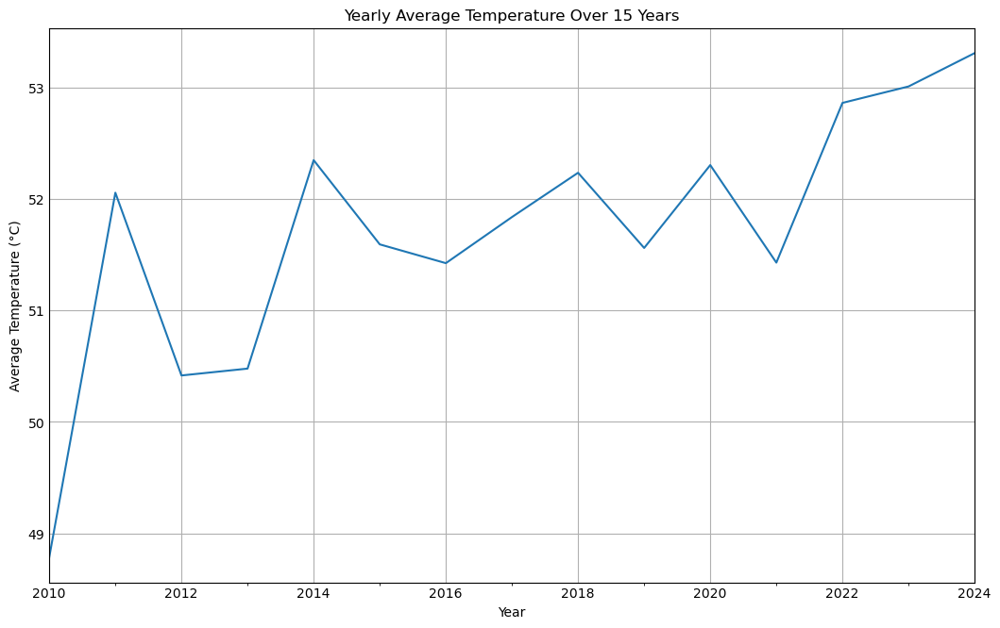

In [202]:
new_data = data.copy()
new_data['Date'] = pd.to_datetime(new_data['time'])
new_data.set_index('Date', inplace=True)

# Plotting Temperature trend over the entire 15 years
new_data['temp'].resample('Y').mean().plot(figsize=(10,6))
plt.title('Yearly Average Temperature Over 15 Years')
plt.xlabel('Year')
plt.ylabel('Average Temperature (°C)')
plt.show()

In [203]:
new_data1 = data.copy()
new_data1['time'] = pd.to_datetime(new_data1['time'])
new_data1['date'] = new_data1['time'].dt.date  # Extract date
new_data1['month'] = new_data1['time'].dt.month 
new_data1['year'] = new_data1['time'].dt.year 
new_data1['time_only'] = new_data1['time'].dt.time  # Extract time
new_data1.set_index('date', inplace=True)
new_data1

,time,temp,humidity,dew,precip,rain,snowfall,snowdepth,wmocode,surfpressure,...,windspeed10m,windspeed100m,winddir10m,winddir100m,windgusts,precipprob,condition,month,year,time_only
date,,,,,,,,,,,,,,,,,,,,,
2010-01-01,2010-01-01 00:00:00,31.8,86,28.0,0.0,0.0,0.0,0.0,3,1003.3,...,11.3,19.8,21,27,21.9,0,no rain,1,2010,00:00:00
2010-01-01,2010-01-01 01:00:00,31.3,86,27.7,0.0,0.0,0.0,0.0,3,1003.4,...,11.1,19.6,19,24,20.8,0,no rain,1,2010,01:00:00
2010-01-01,2010-01-01 02:00:00,30.7,87,27.2,0.0,0.0,0.0,0.0,3,1003.5,...,11.4,20.1,16,21,20.8,0,no rain,1,2010,02:00:00
2010-01-01,2010-01-01 03:00:00,30.3,87,26.8,0.0,0.0,0.0,0.0,0,1004.0,...,11.5,20.4,13,19,20.8,0,no rain,1,2010,03:00:00
2010-01-01,2010-01-01 04:00:00,29.9,87,26.5,0.0,0.0,0.0,0.0,0,1004.3,...,11.2,20.0,13,18,20.6,0,no rain,1,2010,04:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-11-15,2024-11-15 19:00:00,41.1,100,41.1,0.0,0.0,0.0,0.0,3,1025.5,...,1.6,3.3,240,211,2.7,0,no rain,11,2024,19:00:00
2024-11-15,2024-11-15 20:00:00,40.1,100,40.1,0.0,0.0,0.0,0.0,3,1025.3,...,1.1,3.9,281,210,2.7,0,no rain,11,2024,20:00:00
2024-11-15,2024-11-15 21:00:00,38.4,100,38.4,0.0,0.0,0.0,0.0,3,1025.3,...,1.3,3.3,315,230,3.1,0,no rain,11,2024,21:00:00


In [204]:
grouped = new_data1.groupby('date')['temp']

# Calculate average, minimum, and maximum temperature
hourly_stats = grouped.agg(['mean', 'min', 'max']).reset_index()
hourly_stats

,date,mean,min,max
0,2010-01-01,31.462500,28.7,36.6
1,2010-01-02,33.100000,29.1,40.4
2,2010-01-03,32.066667,28.5,35.7
3,2010-01-04,27.316667,23.0,32.1
4,2010-01-05,29.733333,22.8,36.7
...,...,...,...,...
5428,2024-11-11,50.658333,41.1,55.3
5429,2024-11-12,44.129167,39.2,50.1
5430,2024-11-13,44.875000,40.0,52.7
5431,2024-11-14,47.158333,39.3,56.1


<Figure size 3000x1000 with 0 Axes>

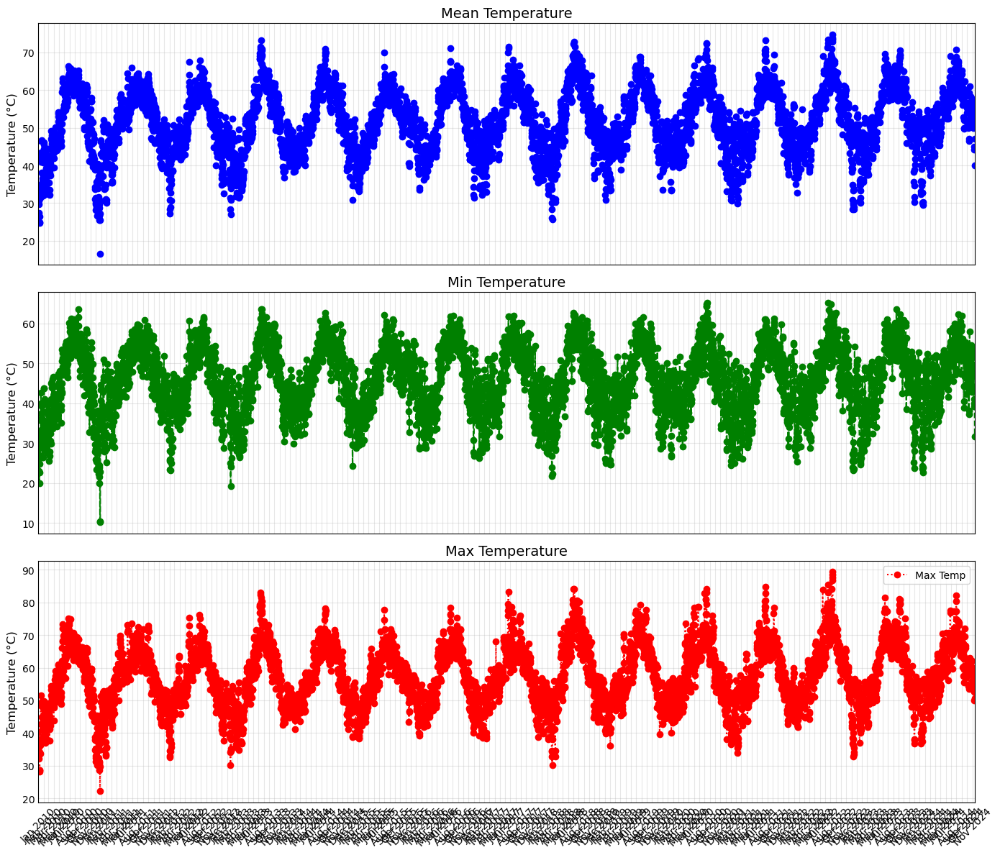

In [205]:

import matplotlib.dates as mdates
plt.style.use('_mpl-gallery')

# make data
np.random.seed(1)

# Plotting
plt.figure(figsize=(30, 10))
fig , ax = plt.subplots(nrows=3,ncols=1,figsize=(14, 12),sharex=True)
ax[0].scatter(hourly_stats['date'], hourly_stats['mean'],color='blue', label='Mean Temp', marker='o')
ax[0].set_title('Mean Temperature', fontsize=14)
ax[0].set_ylabel('Temperature (°C)', fontsize=12)
ax[0].grid(alpha=0.3)
ax[1].plot(hourly_stats['date'], hourly_stats['min'],color='green', label='Min Temp', linestyle='--',marker='o')
ax[1].set_title('Min Temperature', fontsize=14)
ax[1].set_ylabel('Temperature (°C)', fontsize=12)
ax[1].grid(alpha=0.3)
ax[2].plot(hourly_stats['date'], hourly_stats['max'],color='red', label='Max Temp', linestyle=':',marker='o')
ax[2].set_title('Max Temperature', fontsize=14)
ax[2].set_ylabel('Temperature (°C)', fontsize=12)
ax[2].grid(alpha=0.3)

ax[2].xaxis.set_major_locator(mdates.MonthLocator())  # Set ticks to show every month
ax[2].xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))  # Format as "Month Year"

# Set x-axis limits to cover the full period of the data
ax[2].set_xlim([hourly_stats['date'].min(), hourly_stats['date'].max()])
#plt.plot(hourly_stats['date'], hourly_stats['mean'],color='blue', label='Mean Temp', marker='o')
#plt.plot(hourly_stats['date'], hourly_stats['min'],color='green', label='Min Temp', linestyle='--',marker='o')
#plt.plot(hourly_stats['date'], hourly_stats['max'],color='red', label='Max Temp', linestyle=':',marker='o')

#plt.title('Daily Temperature Statistics', fontsize=16)
#plt.xlabel('Month', fontsize=12)
#plt.ylabel('Temperature (°C)', fontsize=12)
plt.xticks(rotation=45)
plt.legend()
#plt.grid(alpha=0.3)
fig.tight_layout()
plt.show()

In [206]:
# Group by year and month
grouped1 = new_data1.groupby(['year', 'month'])['temp']

# Calculate statistics
monthly_stats = grouped1.agg(['mean', 'min', 'max']).reset_index()
monthly_stats['month'] = pd.to_datetime(monthly_stats['month'], format='%m').dt.strftime('%B')

monthly_stats

,year,month,mean,min,max
0,2010,January,35.484274,19.9,51.6
1,2010,February,39.158929,27.7,49.7
2,2010,March,42.256183,25.6,54.4
3,2010,April,47.504861,34.2,60.9
4,2010,May,52.111828,35.0,73.3
...,...,...,...,...,...
174,2024,July,61.172177,45.6,82.2
175,2024,August,62.831048,47.4,77.3
176,2024,September,57.258333,38.9,71.9
177,2024,October,54.164113,37.3,62.9


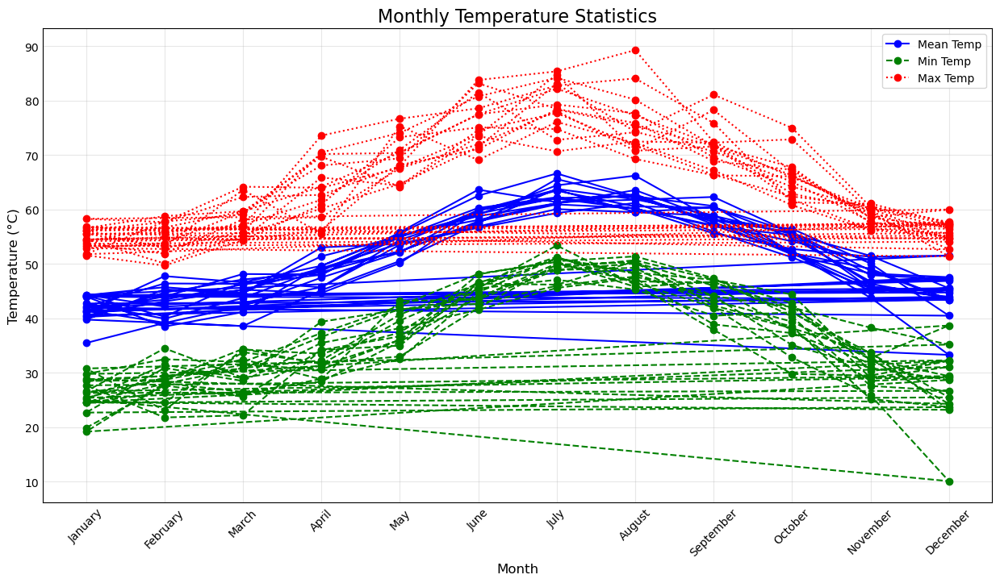

In [207]:
#for i, year in enumerate(unique_years):
#    year_data = monthly_stats[monthly_stats['year'] == year]
    #plt.plot(year_data['month'], year_data['temperature'], 
     #        label=str(year), color=colors[i], marker='o')
#unique_years = monthly_stats['year'].unique()
#colors = cm.viridis([i / len(unique_years) for i in range(len(unique_years))])
#ax.set(xlim=(0, 8), xticks=np.arange(1, 8),
#       ylim=(0, 8), yticks=np.arange(1, 8))
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm
plt.style.use('_mpl-gallery')

# make data
np.random.seed(1)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(monthly_stats['month'], monthly_stats['mean'],color='blue', label='Mean Temp', marker='o')
plt.plot(monthly_stats['month'], monthly_stats['min'],color='green', label='Min Temp', linestyle='--',marker='o')
plt.plot(monthly_stats['month'], monthly_stats['max'],color='red', label='Max Temp', linestyle=':',marker='o')

plt.title('Monthly Temperature Statistics', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Temperature (°C)', fontsize=12)
plt.xticks(rotation=45)
plt.legend()
plt.grid(alpha=0.3)
plt.show()

In [ ]:
# Lets check the average temperature for only the year 2023
year_2023_temp = monthly_stats.copy()
years = [2020,2021,2022,2023,2024]
year_2023_temp = year_2023_temp[year_2023_temp['year'].isin(years)]
year_2023_temp['MM-YYYY'] = year_2023_temp['month'].astype(str) +' ' + year_2023_temp['year'].astype(str)
year_2023_temp

,year,month,mean,min,max,MM-YYYY
120,2020,January,44.254839,26.6,56.8,January 2020
121,2020,February,45.736782,34.5,56.0,February 2020
122,2020,March,44.643952,29.1,56.9,March 2020
123,2020,April,51.420972,31.3,73.6,April 2020
124,2020,May,55.047984,36.0,76.7,May 2020
125,2020,June,58.785139,45.5,78.6,June 2020
126,2020,July,61.160753,47.1,82.8,July 2020
127,2020,August,63.574194,45.3,84.1,August 2020
128,2020,September,58.266667,40.5,75.9,September 2020
129,2020,October,52.022446,41.1,61.3,October 2020


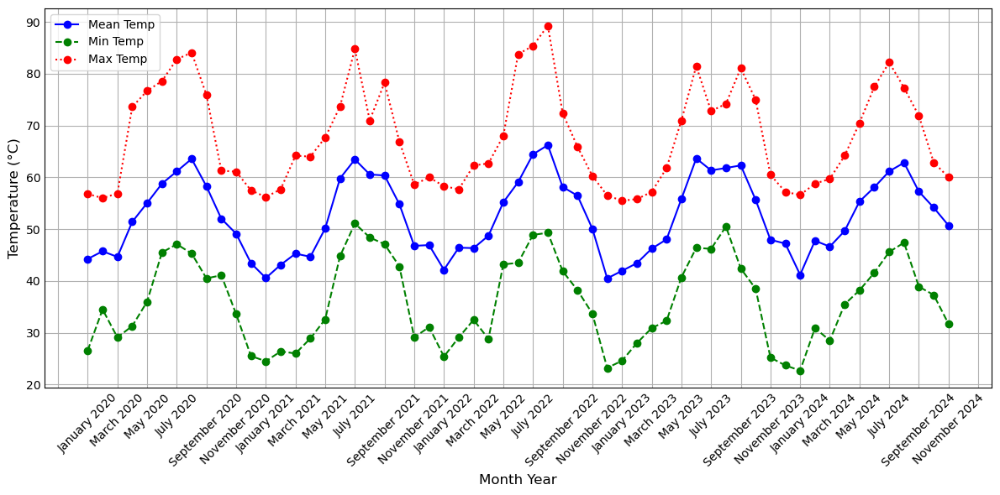

In [209]:
plt.style.use('_mpl-gallery')
from matplotlib.ticker import MaxNLocator
# make data
np.random.seed(1)

# Plotting
#plt.figure(figsize=(30, 10))
#fig , ax = plt.subplots(nrows=3,ncols=1,figsize=(14, 12),sharex=True)
#ax[0].plot(year_2023_temp['MM-YYYY'], year_2023_temp['mean'],color='blue', label='Mean Temp', marker='o')
#ax[0].set_title('Mean Temperature', fontsize=14)
#ax[0].set_xlabel("Month - Year", fontsize=12)
#ax[0].set_ylabel('Temperature (°C)', fontsize=12)
#ax[0].set_xticks(tickrotation=45)
#ax[0].grid(alpha=0.3)
#ax[1].plot(year_2023_temp['MM-YYYY'], year_2023_temp['min'],color='green', label='Min Temp', linestyle='--',marker='o')
#ax[1].set_title('Min Temperature', fontsize=14)
#ax[1].set_ylabel('Temperature (°C)', fontsize=12)
#ax[1].set_xticks(rotation=45)
#ax[1].set_xlabel('Month - Year', fontsize=12)
#ax[1].grid(alpha=0.3)
#ax[2].plot(year_2023_temp['MM-YYYY'], year_2023_temp['max'],color='red', label='Max Temp', linestyle=':',marker='o')
#ax[2].set_title('Max Temperature', fontsize=14)
#ax[2].set_ylabel('Temperature (°C)', fontsize=12)
#ax[2].set_xlabel('Month - Year', fontsize=12)
#ax[2].grid(alpha=0.3)
#ax[2].set_xticks(rotation=45)
plt.figure(figsize=(12, 6))
plt.plot(year_2023_temp['MM-YYYY'], year_2023_temp['mean'],color='blue', label='Mean Temp', marker='o')
plt.plot(year_2023_temp['MM-YYYY'], year_2023_temp['min'],color='green', label='Min Temp', linestyle='--',marker='o')
plt.plot(year_2023_temp['MM-YYYY'], year_2023_temp['max'],color='red', label='Max Temp', linestyle=':',marker='o')

#plt.title('Monthly Temperature Statistics', fontsize=16)
plt.xlabel('Month Year', fontsize=12)
plt.ylabel('Temperature (°C)', fontsize=12,loc='center')

plt.legend()
plt.grid(alpha=1)
plt.xticks(rotation=45)
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=40))
plt.tight_layout()
plt.show()

<Figure size 3000x1000 with 0 Axes>

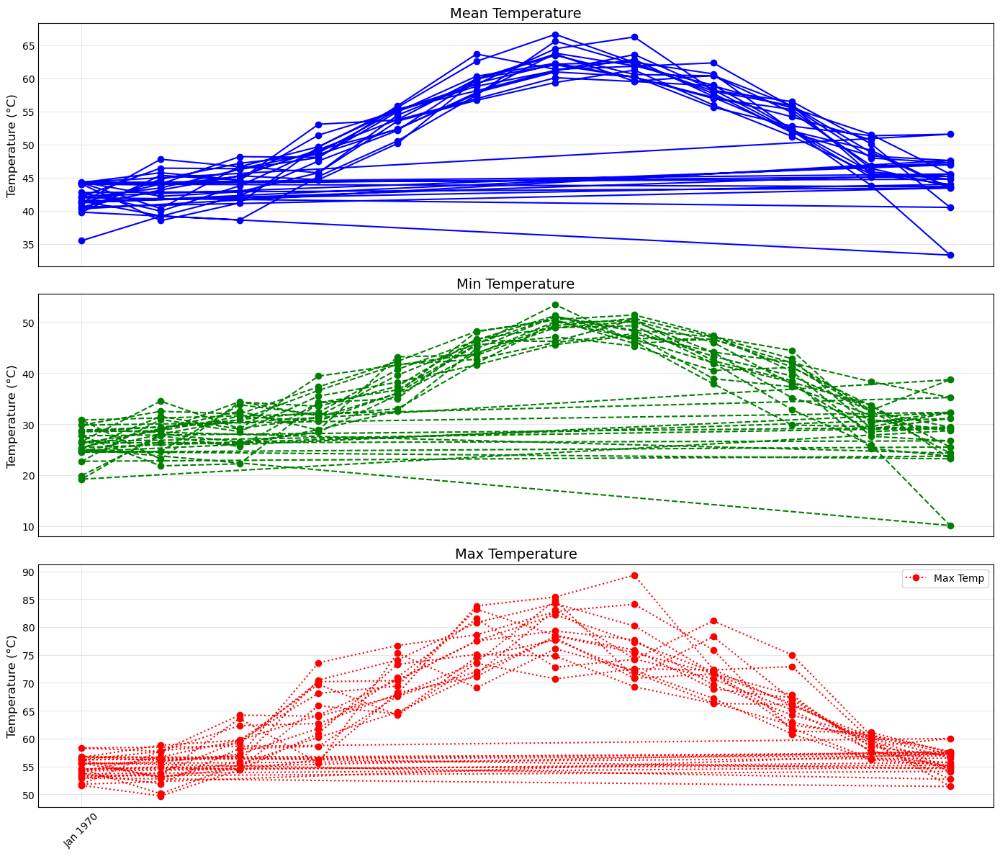

In [210]:
import matplotlib.dates as mdates
plt.style.use('_mpl-gallery')

# make data
np.random.seed(1)

# Plotting
plt.figure(figsize=(30, 10))
fig , ax = plt.subplots(nrows=3,ncols=1,figsize=(14, 12),sharex=True)
ax[0].plot(monthly_stats['month'], monthly_stats['mean'],color='blue', label='Mean Temp', marker='o')
ax[0].set_title('Mean Temperature', fontsize=14)
ax[0].set_ylabel('Temperature (°C)', fontsize=12)
ax[0].grid(alpha=0.3)
ax[1].plot(monthly_stats['month'], monthly_stats['min'],color='green', label='Min Temp', linestyle='--',marker='o')
ax[1].set_title('Min Temperature', fontsize=14)
ax[1].set_ylabel('Temperature (°C)', fontsize=12)
ax[1].grid(alpha=0.3)
ax[2].plot(monthly_stats['month'], monthly_stats['max'],color='red', label='Max Temp', linestyle=':',marker='o')
ax[2].set_title('Max Temperature', fontsize=14)
ax[2].set_ylabel('Temperature (°C)', fontsize=12)
ax[2].grid(alpha=0.3)

ax[2].xaxis.set_major_locator(mdates.MonthLocator())  # Set ticks to show every month
ax[2].xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))  # Format as "Month Year"

# Set x-axis limits to cover the full period of the data
#ax[2].set_xlim([monthly_stats['month'].min(), monthly_stats['month'].max()])
#plt.plot(hourly_stats['date'], hourly_stats['mean'],color='blue', label='Mean Temp', marker='o')
#plt.plot(hourly_stats['date'], hourly_stats['min'],color='green', label='Min Temp', linestyle='--',marker='o')
#plt.plot(hourly_stats['date'], hourly_stats['max'],color='red', label='Max Temp', linestyle=':',marker='o')

#plt.title('Daily Temperature Statistics', fontsize=16)
#plt.xlabel('Month', fontsize=12)
#plt.ylabel('Temperature (°C)', fontsize=12)
plt.xticks(rotation=45)
plt.legend()
#plt.grid(alpha=0.3)
fig.tight_layout()
plt.show()

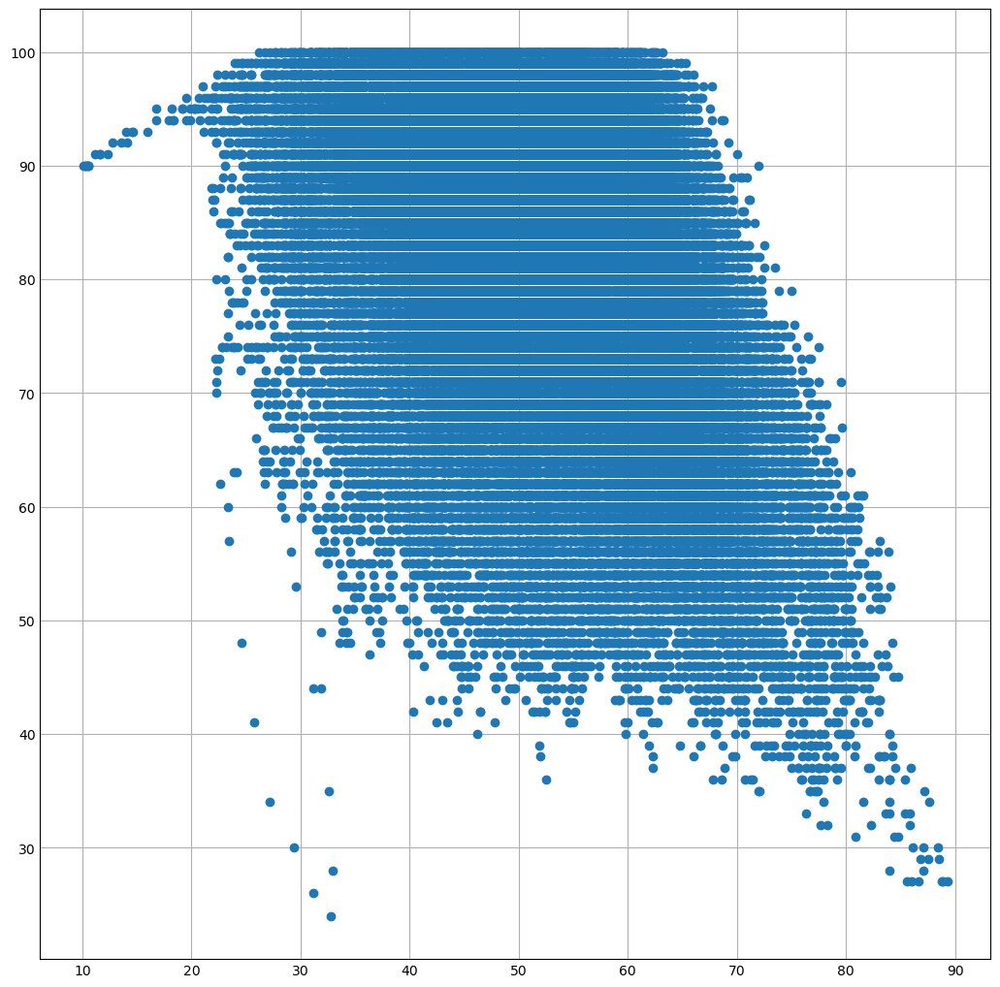

In [211]:

plt.figure(figsize=(10,10))
plt.scatter(x=data['temp'],y=data['humidity'])

In [212]:
filter_year = [2020,2021,2022,2023,2024]
updated_data = new_data1[new_data1['year'].isin(filter_year)]
updated_data

,time,temp,humidity,dew,precip,rain,snowfall,snowdepth,wmocode,surfpressure,...,windspeed10m,windspeed100m,winddir10m,winddir100m,windgusts,precipprob,condition,month,year,time_only
date,,,,,,,,,,,,,,,,,,,,,
2020-01-01,2020-01-01 00:00:00,43.5,93,41.7,0.0,0.0,0.0,0.0,3,1028.8,...,4.2,9.6,74,101,10.1,0,no rain,1,2020,00:00:00
2020-01-01,2020-01-01 01:00:00,44.0,93,42.1,0.0,0.0,0.0,0.0,3,1028.6,...,3.8,8.9,62,100,7.6,0,no rain,1,2020,01:00:00
2020-01-01,2020-01-01 02:00:00,45.0,93,43.1,0.0,0.0,0.0,0.0,3,1028.2,...,3.1,9.1,86,126,7.4,0,no rain,1,2020,02:00:00
2020-01-01,2020-01-01 03:00:00,46.3,96,45.3,0.0,0.0,0.0,0.0,3,1028.1,...,4.1,10.2,135,144,6.9,0,no rain,1,2020,03:00:00
2020-01-01,2020-01-01 04:00:00,46.8,96,45.7,0.0,0.0,0.0,0.0,3,1028.1,...,4.3,9.9,141,142,8.1,0,no rain,1,2020,04:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-11-15,2024-11-15 19:00:00,41.1,100,41.1,0.0,0.0,0.0,0.0,3,1025.5,...,1.6,3.3,240,211,2.7,0,no rain,11,2024,19:00:00
2024-11-15,2024-11-15 20:00:00,40.1,100,40.1,0.0,0.0,0.0,0.0,3,1025.3,...,1.1,3.9,281,210,2.7,0,no rain,11,2024,20:00:00
2024-11-15,2024-11-15 21:00:00,38.4,100,38.4,0.0,0.0,0.0,0.0,3,1025.3,...,1.3,3.3,315,230,3.1,0,no rain,11,2024,21:00:00


In [215]:
grouped_rain = updated_data.groupby(['year', 'month'])['precip']

# Calculate statistics
rain_stats = grouped_rain.agg(['mean', 'max']).reset_index()
rain_stats['month'] = pd.to_datetime(rain_stats['month'], format='%m').dt.strftime('%B')
rain_stats

,year,month,mean,max
0,2020,January,0.105108,4.0
1,2020,February,0.231753,4.3
2,2020,March,0.080376,3.5
3,2020,April,0.061250,2.6
4,2020,May,0.030645,2.1
5,2020,June,0.168194,3.4
6,2020,July,0.067742,4.0
7,2020,August,0.172312,7.5
8,2020,September,0.042361,2.7
9,2020,October,0.176075,4.5


C:\Users\sneha\AppData\Local\Temp\ipykernel_19316\3932063234.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('tab10', len(years))  # 'tab10' is vibrant and distinct


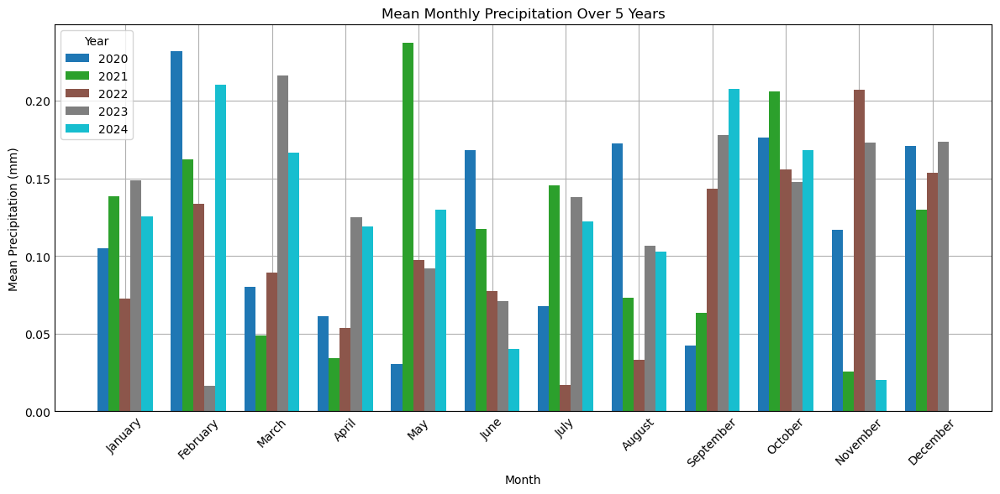

In [221]:
from pandas.api.types import CategoricalDtype
import matplotlib.cm as cm

colormap = cm.get_cmap('tab10', len(years))  # 'tab10' is vibrant and distinct

# Pivot the data for easier plotting
# Define the month order
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 
               'July', 'August', 'September', 'October', 'November', 'December']
month_cat = CategoricalDtype(categories=month_order, ordered=True)
# Apply the month order
rain_stats['month'] = rain_stats['month'].astype(month_cat)

# Sort the data by month and year
rain_stats = rain_stats.sort_values(by=['month', 'year'])

pivot_data = rain_stats.pivot(index='month', columns='year', values='mean')

# Plotting
months = pivot_data.index
years = pivot_data.columns
x = np.arange(len(months))  # Positions for months
width = 0.15  # Bar width



fig, ax = plt.subplots(figsize=(12, 6))

# Create grouped bars for each year
for i, year in enumerate(years):
    ax.bar(x + i * width, pivot_data[year], width, label=str(year), color=colormap(i))

# Customizing the chart
ax.set_xlabel('Month')
ax.set_ylabel('Mean Precipitation (mm)')
ax.set_title('Mean Monthly Precipitation Over 5 Years')
ax.set_xticks(x + width * (len(years) - 1) / 2)
ax.set_xticklabels(months, rotation=45)
ax.legend(title='Year')

# Display the chart
plt.tight_layout()
plt.show()

C:\Users\sneha\AppData\Local\Temp\ipykernel_19316\938256445.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap1 = cm.get_cmap('Set1', len(years))


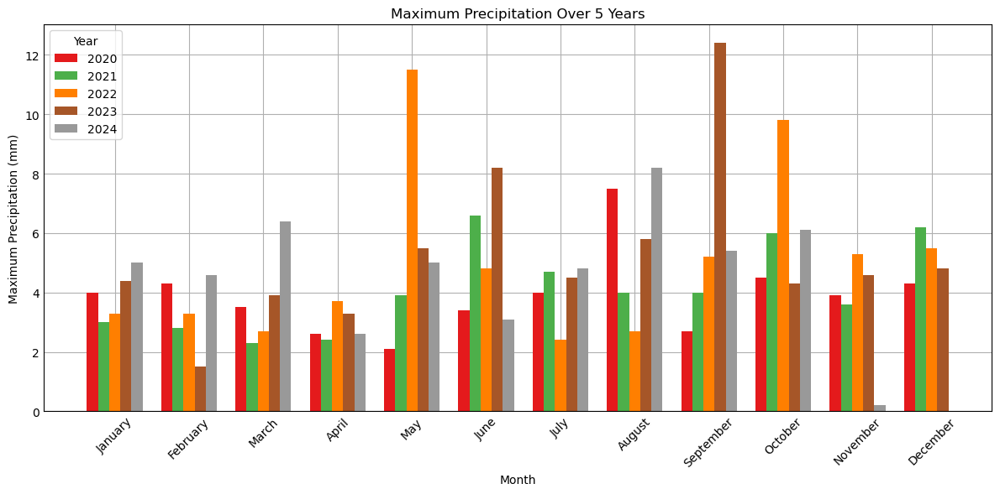

In [223]:
colormap1 = cm.get_cmap('Set1', len(years)) 
pivot_data = rain_stats.pivot(index='month', columns='year', values='max')

# Plotting
months = pivot_data.index
years = pivot_data.columns
x = np.arange(len(months))  # Positions for months
width = 0.15  # Bar width



fig, ax = plt.subplots(figsize=(12, 6))

# Create grouped bars for each year
for i, year in enumerate(years):
    ax.bar(x + i * width, pivot_data[year], width, label=str(year),color=colormap1(i))

# Customizing the chart
ax.set_xlabel('Month')
ax.set_ylabel('Maximum Precipitation (mm)')
ax.set_title('Maximum Precipitation Over 5 Years')
ax.set_xticks(x + width * (len(years) - 1) / 2)
ax.set_xticklabels(months, rotation=45)
ax.legend(title='Year')

# Display the chart
plt.tight_layout()
plt.show()

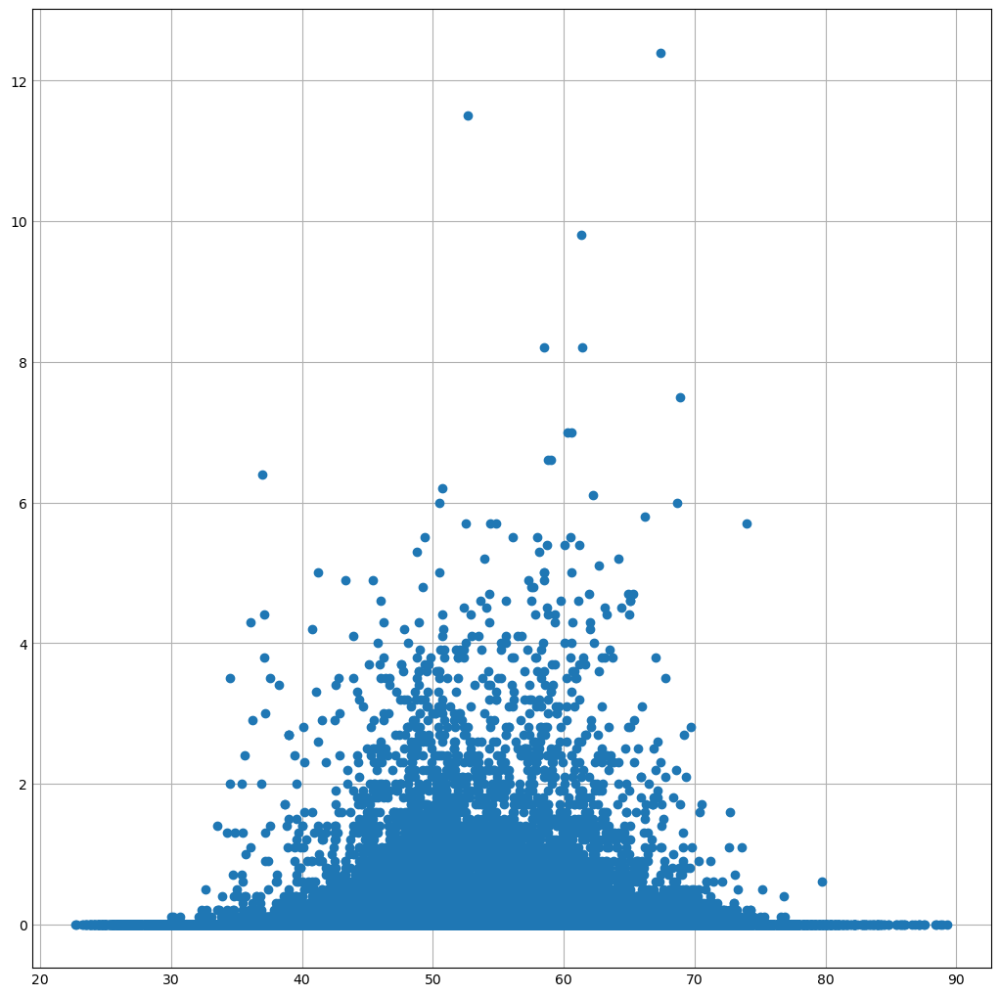

In [224]:

plt.figure(figsize=(10,10))
plt.scatter(x=updated_data['temp'],y=updated_data['precip'])
plt.show()

In [226]:
weather_data.corr()

,temp,humidity,dew,precip,rain,surfpressure,cloudcover,windspeed10m,winddir10m,windgusts,precipprob,Cluster
temp,1.000000,-0.387780,0.888765,0.037554,0.043279,-0.002965,0.074517,0.045900,0.042390,0.111408,0.082816,-0.044245
humidity,-0.387780,1.000000,0.073930,0.140774,0.139537,-0.098626,0.189952,-0.211821,0.008271,-0.294157,0.125639,-0.022865
dew,0.888765,0.073930,1.000000,0.110421,0.116148,-0.057904,0.176021,-0.040066,0.052473,-0.009704,0.155358,-0.064548
precip,0.037554,0.140774,0.110421,1.000000,0.996530,-0.264433,0.198505,0.202848,-0.063249,0.227835,0.574666,0.065394
rain,0.043279,0.139537,0.116148,0.996530,1.000000,-0.261567,0.197300,0.201204,-0.060465,0.226532,0.571812,0.062567
surfpressure,-0.002965,-0.098626,-0.057904,-0.264433,-0.261567,1.000000,-0.183956,-0.353162,-0.051569,-0.366657,-0.354880,0.102355
cloudcover,0.074517,0.189952,0.176021,0.198505,0.197300,-0.183956,1.000000,0.137449,-0.071285,0.134110,0.286998,0.013898
windspeed10m,0.045900,-0.211821,-0.040066,0.202848,0.201204,-0.353162,0.137449,1.000000,0.059192,0.964781,0.263067,-0.129464
winddir10m,0.042390,0.008271,0.052473,-0.063249,-0.060465,-0.051569,-0.071285,0.059192,1.000000,0.062314,-0.052330,-0.850911
windgusts,0.111408,-0.294157,-0.009704,0.227835,0.226532,-0.366657,0.134110,0.964781,0.062314,1.000000,0.295472,-0.128522


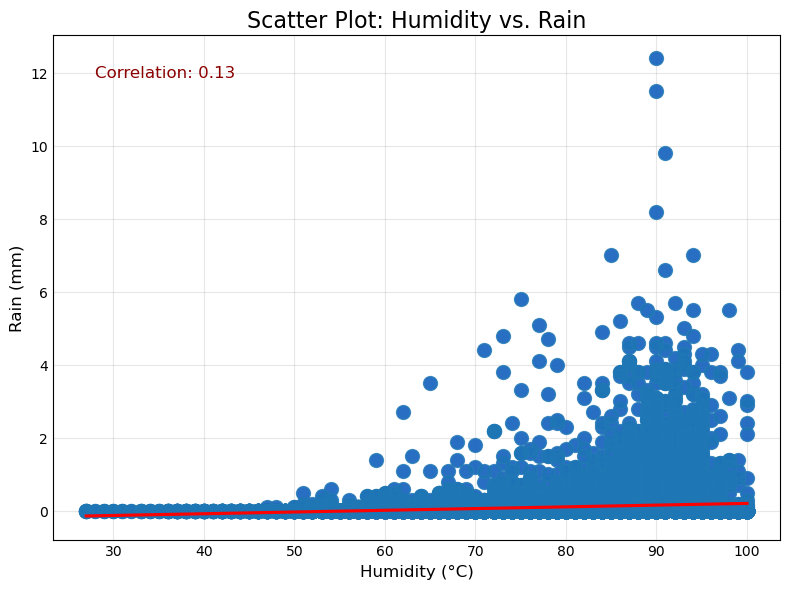

In [240]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
filter_year = [2022,2023]
two_yrs_data = new_data1[new_data1['year'].isin(filter_year)]

# Calculate the correlation coefficient
correlation = two_yrs_data['humidity'].corr(two_yrs_data['rain'])

# Create the scatter plot
plt.figure(figsize=(8, 6))
sns.scatterplot(data=two_yrs_data, x='humidity', y='rain', s=100, color='blue', alpha=0.7)
sns.regplot(data=two_yrs_data, x='humidity', y='rain', scatter_kws={'s': 100}, line_kws={'color': 'red'})
# Annotate the correlation coefficient
plt.text(
    x=two_yrs_data['humidity'].min() + 1,
    y=two_yrs_data['rain'].max() - 0.5,
    s=f"Correlation: {correlation:.2f}",
    fontsize=12,
    color='darkred'
)

# Customize the plot
plt.title("Scatter Plot: Humidity vs. Rain", fontsize=16)
plt.xlabel("Humidity (°C)", fontsize=12)
plt.ylabel("Rain (mm)", fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()

# Show the plot
plt.show()


In [232]:
from numpy.polynomial.polynomial import Polynomial
import numpy as np

# Fit a polynomial of degree 2
coeffs = Polynomial.fit(updated_data['temp'], updated_data['precip'], deg=2)
updated_data['temperature_squared'] = updated_data['temp']**2

# Calculate correlation with the squared term
corr_squared = updated_data[['temp', 'temperature_squared']].corrwith(updated_data['precip'])
print(corr_squared)


temp                   0.040608
temperature_squared    0.028823
dtype: float64


C:\Users\sneha\AppData\Local\Temp\ipykernel_19316\3134433888.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  updated_data['temperature_squared'] = updated_data['temp']**2


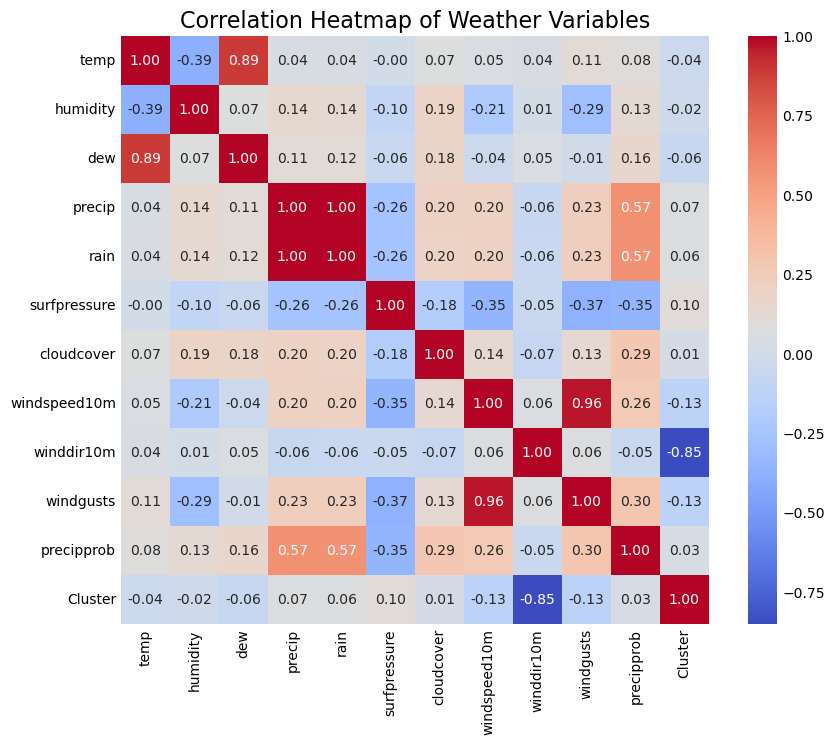

In [238]:
# Correlation heatmap
corr_matrix = weather_data.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", square=True)
plt.title("Correlation Heatmap of Weather Variables", fontsize=16)
plt.show()

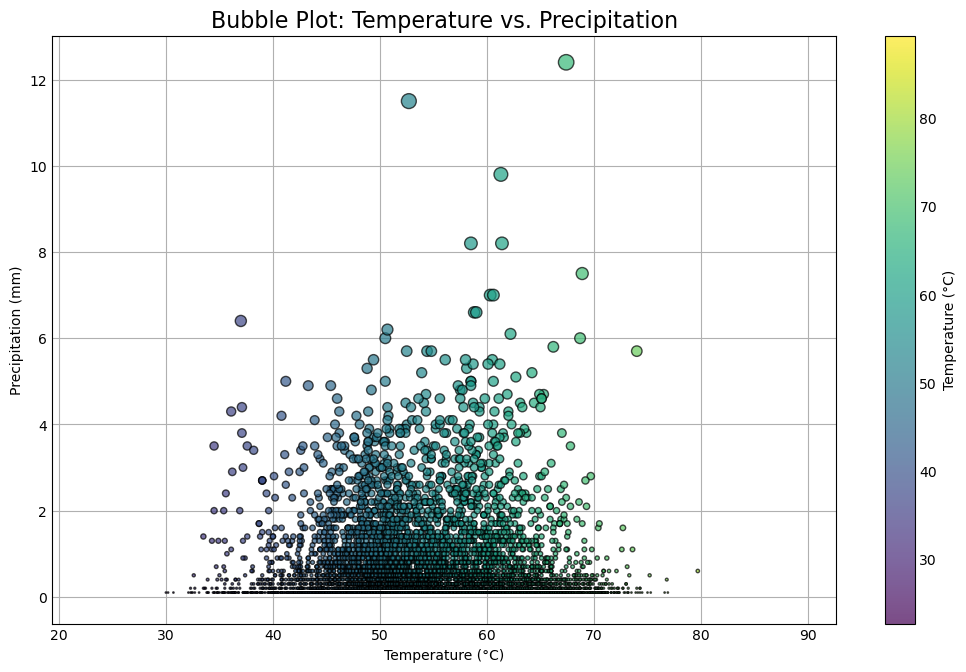

In [239]:
# Bubble plot
plt.figure(figsize=(10, 6))
plt.scatter(
    updated_data["temp"],
    updated_data["precip"],
    s=updated_data["precip"] * 10,  # Bubble size scaled by precipitation
    c=updated_data["temp"],  # Color mapped to temperature
    cmap="viridis",
    alpha=0.7,
    edgecolor="k"
)
plt.colorbar(label="Temperature (°C)")
plt.xlabel("Temperature (°C)")
plt.ylabel("Precipitation (mm)")
plt.title("Bubble Plot: Temperature vs. Precipitation", fontsize=16)
plt.show()

In [241]:
import plotly.express as px

fig = px.scatter(
    updated_data,
    x="temp",
    y="precip",
    size="precip",
    color="temp",
    hover_data=["humidity"],
    title="Interactive Temperature vs. Precipitation",
)
fig.update_layout(xaxis_title="Temperature (°C)", yaxis_title="Precipitation (mm)")
fig.show()

In [242]:
fig = px.scatter(
    updated_data,
    x="dew",
    y="rain",
    size="rain",
    color="dew",
    hover_data=["humidity"],
    title="Interactive Dew vs. Rain",
)
fig.update_layout(xaxis_title="Dew", yaxis_title="Rain (mm)")
fig.show()

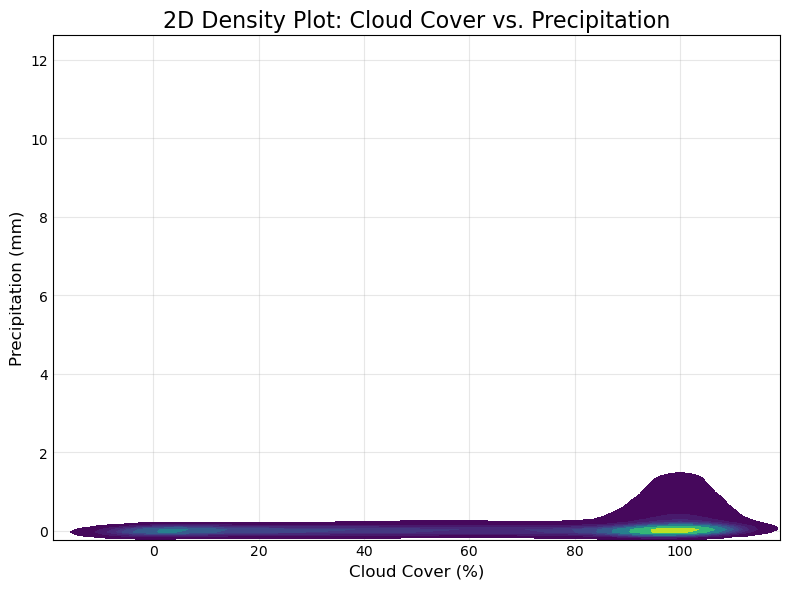

In [246]:
# 2D density plot
plt.figure(figsize=(8, 6))
sns.kdeplot(data=updated_data, x="cloudcover", y="precip", cmap="viridis", fill=True)
plt.title("2D Density Plot: Cloud Cover vs. Precipitation", fontsize=16)
plt.xlabel("Cloud Cover (%)", fontsize=12)
plt.ylabel("Precipitation (mm)", fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

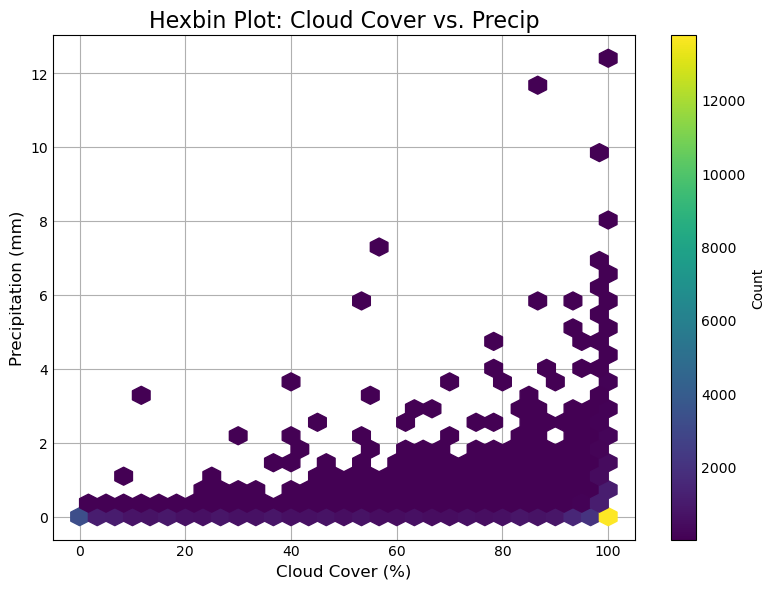

In [247]:
# Hexbin plot using Matplotlib
plt.figure(figsize=(8, 6))
plt.hexbin(updated_data["cloudcover"], updated_data["precip"], gridsize=30, cmap="viridis", mincnt=1)
plt.colorbar(label="Count")
plt.title("Hexbin Plot: Cloud Cover vs. Precip", fontsize=16)
plt.xlabel("Cloud Cover (%)", fontsize=12)
plt.ylabel("Precipitation (mm)", fontsize=12)
plt.tight_layout()
plt.show()

C:\Users\sneha\AppData\Local\Temp\ipykernel_19316\2471122089.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



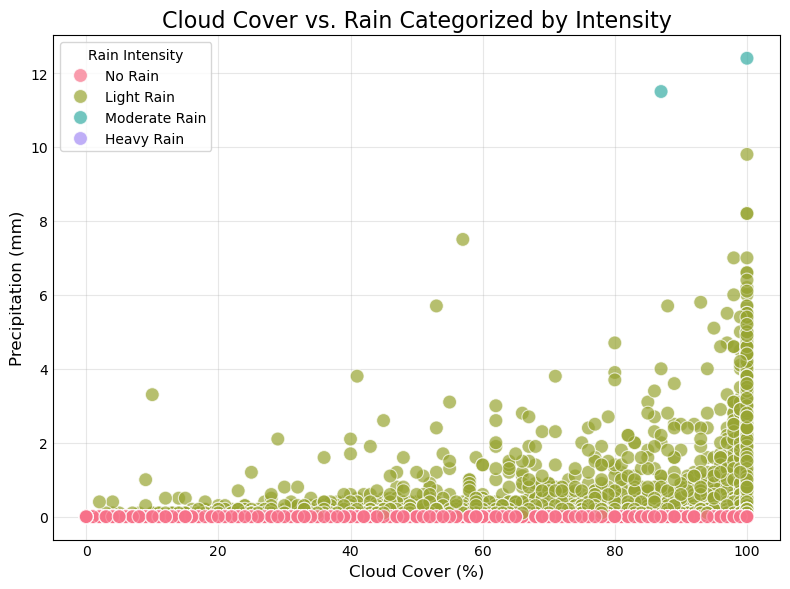

In [248]:

# Categorize rain intensity
conditions = [
    (updated_data["precip"] == 0),
    (updated_data["precip"]> 0) & (updated_data["precip"] <= 10),
    (updated_data["precip"] > 10) & (updated_data["precip"] <= 30),
    (updated_data["precip"] > 30)
]
categories = ["No Rain", "Light Rain", "Moderate Rain", "Heavy Rain"]
updated_data["rain_category"] = pd.cut(updated_data["precip"], bins=[-1, 0, 10, 30, float('inf')], labels=categories)

# Scatter plot with categories
plt.figure(figsize=(8, 6))
sns.scatterplot(data=updated_data, x="cloudcover", y="precip", hue="rain_category", s=100, alpha=0.7)
plt.title("Cloud Cover vs. Rain Categorized by Intensity", fontsize=16)
plt.xlabel("Cloud Cover (%)", fontsize=12)
plt.ylabel("Precipitation (mm)", fontsize=12)
plt.legend(title="Rain Intensity")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [253]:
updated_data.head()

,time,temp,humidity,dew,precip,rain,snowfall,snowdepth,wmocode,surfpressure,...,windgusts,precipprob,condition,month,year,time_only,temperature_squared,log_precip,log_temp,rain_category
date,,,,,,,,,,,,,,,,,,,,,
2020-01-01,2020-01-01 00:00:00,43.5,93,41.7,0.0,0.0,0.0,0.0,3,1028.8,...,10.1,0,no rain,1,2020,00:00:00,1892.25,0.0,3.795489,No Rain
2020-01-01,2020-01-01 01:00:00,44.0,93,42.1,0.0,0.0,0.0,0.0,3,1028.6,...,7.6,0,no rain,1,2020,01:00:00,1936.00,0.0,3.806662,No Rain
2020-01-01,2020-01-01 02:00:00,45.0,93,43.1,0.0,0.0,0.0,0.0,3,1028.2,...,7.4,0,no rain,1,2020,02:00:00,2025.00,0.0,3.828641,No Rain
2020-01-01,2020-01-01 03:00:00,46.3,96,45.3,0.0,0.0,0.0,0.0,3,1028.1,...,6.9,0,no rain,1,2020,03:00:00,2143.69,0.0,3.856510,No Rain
2020-01-01,2020-01-01 04:00:00,46.8,96,45.7,0.0,0.0,0.0,0.0,3,1028.1,...,8.1,0,no rain,1,2020,04:00:00,2190.24,0.0,3.867026,No Rain


In [265]:
!pip install windrose

In [282]:
import numpy as np
import pandas as pd
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

In [275]:
weather_data.head()

,temp,humidity,dew,precip,rain,surfpressure,cloudcover,windspeed10m,winddir10m,windgusts,precipprob
0,31.8,86,28.0,0.0,0.0,1003.3,86,11.3,21,21.9,0
1,31.3,86,27.7,0.0,0.0,1003.4,93,11.1,19,20.8,0
2,30.7,87,27.2,0.0,0.0,1003.5,81,11.4,16,20.8,0
3,30.3,87,26.8,0.0,0.0,1004.0,4,11.5,13,20.8,0
4,29.9,87,26.5,0.0,0.0,1004.3,3,11.2,13,20.6,0


In [274]:
weather_data = weather_data.drop('Cluster', axis=1)

In [279]:
# Select relevant features for clustering
features = updated_data[['temp', 'humidity', 'dew', 'windspeed10m','winddir10m','cloudcover','precip']]

# Normalize the features to have zero mean and unit variance
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

In [289]:
# Apply PCA to reduce dimensions to 2 for visualization
pca = PCA(n_components=4)  # Use n_components=3 for 3D plots or clustering
pca_features = pca.fit_transform(scaled_features)

# Create a DataFrame with PCA-transformed data
pca_df = pd.DataFrame(pca_features, columns=['PC1', 'PC2','PC3','PC4'])

# Add cluster labels from DBSCAN (if already computed)
#pca_df['cluster'] = updated_data['cluster']

In [290]:
# Apply DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=5)  # Adjust eps and min_samples as needed
labels = dbscan.fit_predict(pca_features)

# Add cluster labels to the original dataset
pca_df['cluster'] = labels

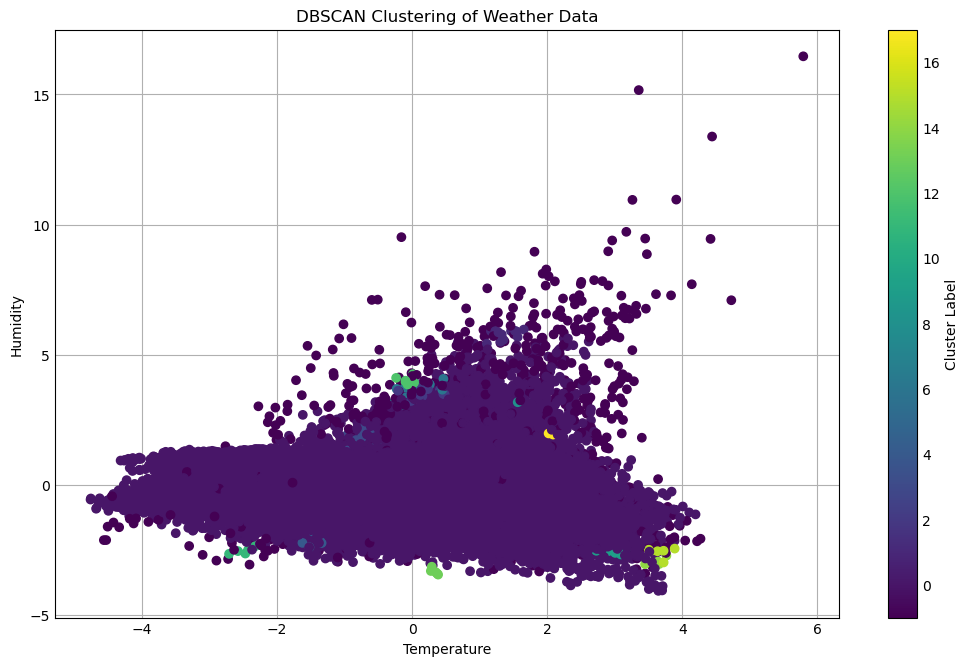

In [309]:
# Visualize clustering on first two features (e.g., temperature vs humidity)
plt.figure(figsize=(10, 6))
plt.scatter(pca_df['PC1'], pca_df['PC2'], c=pca_df['cluster'], cmap='viridis', marker='o')
plt.colorbar(label='Cluster Label')
plt.xlabel('Temperature')
plt.ylabel('Humidity')
plt.title('DBSCAN Clustering of Weather Data')
plt.show()

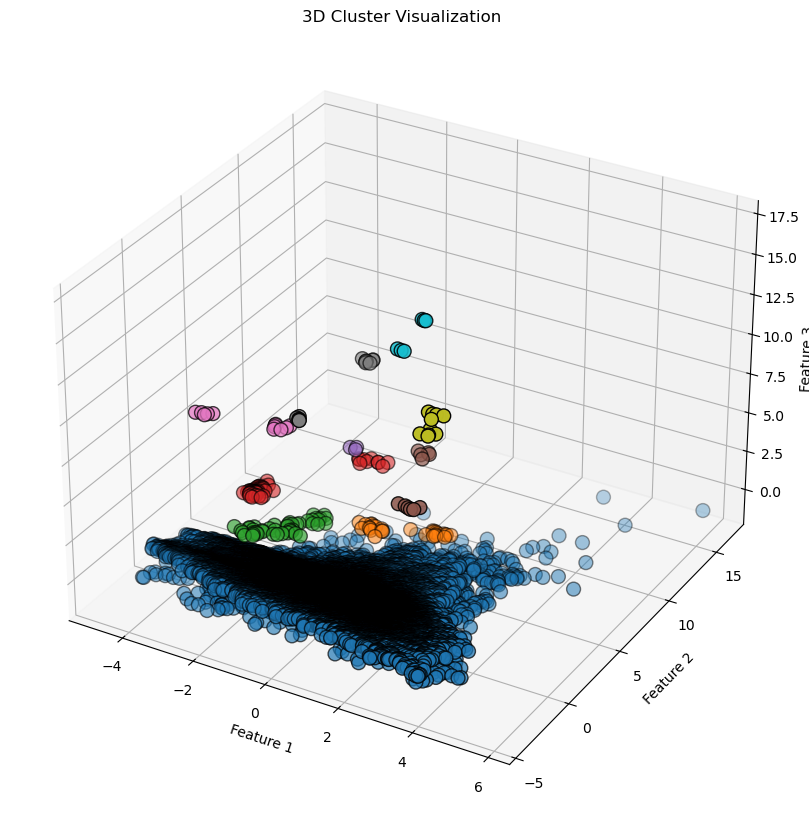

In [310]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# 3D scatter plot
ax.scatter(pca_df['PC1'], pca_df['PC2'],pca_df['cluster'], c=pca_df['cluster'], cmap='tab10', s=100, edgecolor='k')
ax.set_xlabel('Feature 1')
ax.set_ylabel('Feature 2')
ax.set_zlabel('Feature 3')
plt.title('3D Cluster Visualization')
plt.show()

In [293]:
explained_variance = pca.explained_variance_ratio_
print(f"Explained Variance Ratio by PC1 and PC2: {explained_variance}")
print(f"Total Explained Variance by 2 PCs: {sum(explained_variance)}")

Explained Variance Ratio by PC1 and PC2: [0.2853758  0.19805666 0.17800053 0.14696458]
Total Explained Variance by 2 PCs: 0.80839757462169


In [294]:
for cluster in set(labels):
    cluster_data = updated_data[updated_data['cluster'] == cluster]
    print(f"Cluster {cluster}:")
    print(cluster_data.describe())

Cluster 0:
                                time          temp      humidity  \
count                          37169  37169.000000  37169.000000   
mean   2022-06-17 13:05:20.880303360     52.049775     82.595416   
min              2020-01-01 00:00:00     22.700000     27.000000   
25%              2021-03-30 05:00:00     46.100000     75.000000   
50%              2022-06-20 07:00:00     52.200000     86.000000   
75%              2023-09-02 02:00:00     58.600000     92.000000   
max              2024-11-15 23:00:00     89.300000    100.000000   
std                              NaN      9.306696     11.760074   

                dew        precip          rain      snowfall     snowdepth  \
count  37169.000000  37169.000000  37169.000000  37169.000000  37169.000000   
mean      46.575404      0.048713      0.048672      0.000028      0.000130   
min       19.100000      0.000000      0.000000      0.000000      0.000000   
25%       41.200000      0.000000      0.000000      0.00000